# Integrantes
* David
* Farid
* Leonardo
* Luís
* Rodrigo Montenegro

# Instalação de dependências

In [1]:
!pip install -r requirements.txt

# Importando módulos python

In [2]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, f1_score
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn import tree
from sklearn.feature_selection import RFECV
import graphviz
import missingno as msno
%matplotlib inline

# Definições

In [3]:
# fixada semente para bibliotecas que utilizam métodos
# para geração pseudo-aleatória
SEED=0
np.random.seed(SEED)
random.seed(SEED)

# função que recebe base de testes, uma lista de modelos
# para calcular as métricas e imprimir as matrizes de confusão
# em um grid para comparação
def avalia_modelos(feats, labels, modelos, figsize=None):
  
  if not figsize:
      figsize=(16,4*int(np.ceil(len(modelos)/3)))

  fig, ax = plt.subplots(int(np.ceil(len(modelos)/3)), 3, figsize=figsize)

  plt.subplots_adjust(hspace=0.5, wspace=0.3)
    
  tabela = """
     -------- | ---------------------------------------
     Modelo   | {:<}                                       
     Acurácia | {:.3f}                                     
     F1 Score | {:.3f}                                     
     Kappa    | {:.3f}                                     
     -------- | ---------------------------------------
  """

  for i, m in enumerate(modelos):
    
      leg = m['leg']
      titulo = m['titulo']
      modelo = m['modelo']
      pre = m['pre']
    
      labels_pred = modelo.predict(pre(feats))

      confMatrix = confusion_matrix(labels_pred, labels)

      sns.heatmap(confMatrix, annot=True, fmt=".0f", ax=ax.flat[i])
      ax.flat[i].set(xlabel='Real')
      ax.flat[i].set(ylabel='Previsto')
      if titulo:
          ax.flat[i].set_title('Matriz de confusão\n' + titulo)
      else:
          ax.flat[i].set_title('Matriz de confusão')

      # Colocar os nomes
      ax.flat[i].xaxis.set_ticklabels(leg)
      ax.flat[i].yaxis.set_ticklabels(leg)
    
      m['accuracy'] = accuracy_score(labels, labels_pred)
      m['kappa'] = cohen_kappa_score(labels, labels_pred)
      m['f1'] = f1_score(labels, labels_pred, average='weighted')
        
  plt.show()
    
  for m in modelos:
    print(tabela.format(m['titulo'], m['accuracy'], m['f1'], m['kappa']))
               
# funções que instanciam os diferentes modelos que vamos analisar
# e já os treina com a base treino informada
def treinaSVC(feats, labels):
  model = SVC()
  model.fit(feats, labels)
  return model

def treinaDT(feats, labels):
  model = DecisionTreeClassifier()
  model.fit(feats, labels)
  return model

def treinaRF(feats, labels):
  model = RandomForestClassifier()
  model.fit(feats, labels)
  return model

def treinaKNN(feats, labels):
  model = KNeighborsClassifier()
  model.fit(feats, labels)
  return model

# Carregando as bases de treino e teste

## Treino

In [4]:
# lendo o csv de treino
df_treino = pd.read_csv('horse.csv')
df_treino.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                299 non-null    object 
 1   age                    299 non-null    object 
 2   hospital_number        299 non-null    int64  
 3   rectal_temp            239 non-null    float64
 4   pulse                  275 non-null    float64
 5   respiratory_rate       241 non-null    float64
 6   temp_of_extremities    243 non-null    object 
 7   peripheral_pulse       230 non-null    object 
 8   mucous_membrane        252 non-null    object 
 9   capillary_refill_time  267 non-null    object 
 10  pain                   244 non-null    object 
 11  peristalsis            255 non-null    object 
 12  abdominal_distention   243 non-null    object 
 13  nasogastric_tube       195 non-null    object 
 14  nasogastric_reflux     193 non-null    object 
 15  nasoga

In [5]:
df_treino.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,no,adult,530101,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,...,45.0,8.4,NaN,NaN,died,no,11300,0,0,no
1,yes,adult,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,...,50.0,85.0,cloudy,2.0,euthanized,no,2208,0,0,no
2,no,adult,530334,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,...,33.0,6.7,NaN,NaN,lived,no,0,0,0,yes
3,yes,young,5290409,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,...,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0,yes
4,no,adult,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,...,74.0,7.4,NaN,NaN,died,no,4300,0,0,no


## Teste

In [6]:
# lendo o csv de teste
df_teste = pd.read_csv('horseTest.csv')
df_teste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89 entries, 0 to 88
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                89 non-null     object 
 1   age                    89 non-null     object 
 2   hospital_number        89 non-null     int64  
 3   rectal_temp            73 non-null     float64
 4   pulse                  84 non-null     float64
 5   respiratory_rate       73 non-null     float64
 6   temp_of_extremities    76 non-null     object 
 7   peripheral_pulse       70 non-null     object 
 8   mucous_membrane        79 non-null     object 
 9   capillary_refill_time  85 non-null     object 
 10  pain                   77 non-null     object 
 11  peristalsis            79 non-null     object 
 12  abdominal_distention   77 non-null     object 
 13  nasogastric_tube       66 non-null     object 
 14  nasogastric_reflux     61 non-null     object 
 15  nasogast

In [7]:
df_teste.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,no,adult,1,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,...,74.0,7.4,NaN,NaN,died,no,4300,0,0,no
1,no,adult,2,39.1,72.0,52.0,warm,NaN,bright_pink,less_3_sec,...,50.0,7.8,NaN,NaN,lived,yes,2111,0,0,no
2,yes,adult,3,37.2,42.0,12.0,warm,normal,normal_pink,less_3_sec,...,NaN,7.0,NaN,NaN,lived,no,4124,0,0,no
3,no,young,4,38.0,92.0,28.0,normal,normal,bright_pink,less_3_sec,...,37.0,6.1,clear,NaN,died,no,0,0,0,yes
4,yes,adult,5,37.6,64.0,21.0,normal,normal,bright_pink,less_3_sec,...,40.0,7.0,clear,NaN,lived,yes,4205,0,0,yes


# Frequência dos valores dos atributos

In [8]:
# verificando as colunas e seus valores
for attr in df_treino.columns:
    print(df_treino[attr].value_counts())
    print()

yes    180
no     119
Name: surgery, dtype: int64

adult    275
young     24
Name: age, dtype: int64

529796    2
528931    2
528890    2
527544    2
528151    2
         ..
527698    1
530255    1
530254    1
533836    1
535043    1
Name: hospital_number, Length: 283, dtype: int64

38.0    25
38.5    19
38.3    18
37.8    17
38.2    16
38.6    12
38.1    12
37.5    12
38.4    11
37.6     7
37.7     7
37.2     7
38.7     7
37.9     7
38.8     6
37.3     6
39.2     5
39.3     4
38.9     4
39.5     4
39.0     4
37.4     3
39.4     3
37.1     3
40.3     2
36.5     2
37.0     2
39.1     2
36.0     1
40.0     1
36.4     1
39.9     1
35.4     1
36.9     1
39.6     1
36.1     1
36.8     1
40.8     1
39.7     1
36.6     1
Name: rectal_temp, dtype: int64

48.0     27
60.0     25
40.0     18
88.0     12
52.0     12
100.0    11
44.0     11
72.0     11
120.0    10
42.0     10
80.0      8
64.0      8
96.0      8
84.0      8
54.0      7
56.0      7
50.0      6
66.0      6
68.0      5
104.0     5
70.

In [9]:
for attr in df_teste.columns:
    print(df_teste[attr].value_counts())
    print()

yes    52
no     37
Name: surgery, dtype: int64

adult    79
young    10
Name: age, dtype: int64

89    1
44    1
24    1
25    1
26    1
     ..
61    1
62    1
63    1
64    1
1     1
Name: hospital_number, Length: 89, dtype: int64

38.0    12
37.8     7
38.6     6
38.3     5
38.5     5
38.8     3
38.4     3
39.4     2
39.0     2
37.0     2
36.5     2
38.9     2
37.3     2
37.5     2
37.9     2
37.7     2
39.5     1
36.0     1
38.2     1
39.7     1
39.1     1
37.1     1
38.7     1
38.1     1
37.2     1
39.2     1
36.1     1
39.3     1
40.8     1
37.6     1
Name: rectal_temp, dtype: int64

48.0     6
54.0     6
60.0     6
42.0     5
64.0     5
100.0    4
120.0    4
56.0     4
40.0     4
104.0    3
72.0     3
80.0     3
88.0     3
44.0     2
96.0     2
84.0     2
36.0     2
70.0     2
66.0     2
112.0    1
150.0    1
92.0     1
75.0     1
130.0    1
184.0    1
108.0    1
140.0    1
82.0     1
86.0     1
46.0     1
160.0    1
129.0    1
76.0     1
78.0     1
45.0     1
Name: pulse, dtyp

## Ajustar valores de 'total_protein'

In [10]:
def ajusta_total_protein(v, threshold=40, adjust=10):
    if v > threshold:
        return v/adjust
    return v

df_treino['total_protein'] = df_treino['total_protein'].map(ajusta_total_protein)
df_teste['total_protein'] = df_teste['total_protein'].map(ajusta_total_protein)

# Trocar euthanized por died

In [11]:
# cavalo que sofreu eutanázia é cavalo morto :/
# troca-se todos os labels 'euthanized' por 'died' 
# em treino e em teste
df_treino['outcome'] = df_treino['outcome'].map(lambda v: 'died' if v == 'euthanized' else v)
df_teste['outcome'] = df_teste['outcome'].map(lambda v: 'died' if v == 'euthanized' else v)

In [12]:
df_treino['outcome'].value_counts()

lived    178
died     121
Name: outcome, dtype: int64

In [13]:
df_teste['outcome'].value_counts()

lived    53
died     36
Name: outcome, dtype: int64

# Remoção de atributos

Segundo o dicionário de dados que acompanha o trabalho, os campos 'cp_data' e 'hospital_number' podem ser 
imediatamente desconsiderados.

In [14]:
# remove-se em treino
df_treino = df_treino.drop(columns=['cp_data', 'hospital_number'])
df_treino.head()

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
0,no,adult,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,extreme_pain,...,distend_large,45.0,8.4,NaN,NaN,died,no,11300,0,0
1,yes,adult,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,...,other,50.0,8.5,cloudy,2.0,died,no,2208,0,0
2,no,adult,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,...,normal,33.0,6.7,NaN,NaN,lived,no,0,0,0
3,yes,young,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,...,NaN,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0
4,no,adult,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,...,NaN,74.0,7.4,NaN,NaN,died,no,4300,0,0


In [15]:
# remove-se em teste
df_teste = df_teste.drop(columns=['cp_data', 'hospital_number'])
df_teste.head()

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
0,no,adult,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,...,NaN,74.0,7.4,NaN,NaN,died,no,4300,0,0
1,no,adult,39.1,72.0,52.0,warm,NaN,bright_pink,less_3_sec,depressed,...,distend_small,50.0,7.8,NaN,NaN,lived,yes,2111,0,0
2,yes,adult,37.2,42.0,12.0,warm,normal,normal_pink,less_3_sec,mild_pain,...,distend_large,NaN,7.0,NaN,NaN,lived,no,4124,0,0
3,no,young,38.0,92.0,28.0,normal,normal,bright_pink,less_3_sec,alert,...,normal,37.0,6.1,clear,NaN,died,no,0,0,0
4,yes,adult,37.6,64.0,21.0,normal,normal,bright_pink,less_3_sec,depressed,...,distend_large,40.0,7.0,clear,NaN,lived,yes,4205,0,0


# Label, variáveis categóricas e numéricas

In [16]:
# vamos separar o que são as categóricas e numéricas
# para posterior tratamento
categoricas = df_treino.columns[df_treino.dtypes==object].tolist()
numericas = df_treino.columns[df_treino.dtypes!=object].tolist()
# os campos 'lesion_1', 'lesion_2' e 'lesion_3' parecem numéricos
# mas são categóricos pois é uma sequência numérica que
# representa uma série de informações sobre as lesões
# dos animais
numericas.remove('lesion_1')
numericas.remove('lesion_2')
numericas.remove('lesion_3')
categoricas.remove('outcome')
categoricas += ['lesion_1', 'lesion_2', 'lesion_3']

# Análise dos dados

## Shape

In [17]:
# então temos 299 amostras de treino, com 26 atributos
df_treino.shape

(299, 26)

In [18]:
# em teste, temos 89 amostras
df_teste.shape

(89, 26)

## Stats

In [19]:
df_treino.describe(include='all')

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
count,299,299,239.000000,275.000000,241.000000,243,230,252,267,244,...,181,270.000000,266.000000,134,101.000000,299,299,299.000000,299.000000,299.000000
unique,2,2,NaN,NaN,NaN,4,4,6,3,5,...,5,NaN,NaN,3,NaN,2,2,NaN,NaN,NaN
top,yes,adult,NaN,NaN,NaN,cool,normal,normal_pink,less_3_sec,mild_pain,...,distend_large,NaN,NaN,cloudy,NaN,lived,yes,NaN,NaN,NaN
freq,180,275,NaN,NaN,NaN,108,114,79,187,67,...,78,NaN,NaN,47,NaN,178,190,NaN,NaN,NaN
mean,NaN,NaN,38.168619,72.000000,30.460581,NaN,NaN,NaN,NaN,NaN,...,NaN,46.307407,6.853008,NaN,3.039604,NaN,NaN,3659.709030,90.528428,7.387960
std,NaN,NaN,0.733744,28.646219,17.666102,NaN,NaN,NaN,NaN,NaN,...,NaN,10.436743,1.093139,NaN,1.967947,NaN,NaN,5408.472421,650.637139,127.749768
min,NaN,NaN,35.400000,30.000000,8.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,23.000000,3.300000,NaN,0.100000,NaN,NaN,0.000000,0.000000,0.000000
25%,NaN,NaN,37.800000,48.000000,18.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,38.000000,6.200000,NaN,2.000000,NaN,NaN,2111.500000,0.000000,0.000000
50%,NaN,NaN,38.200000,64.000000,25.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,45.000000,6.700000,NaN,2.300000,NaN,NaN,2322.000000,0.000000,0.000000
75%,NaN,NaN,38.500000,88.000000,36.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,52.000000,7.500000,NaN,3.900000,NaN,NaN,3209.000000,0.000000,0.000000


> **muitos atributos apresentam missing**

In [20]:
df_teste.describe(include='all')

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3
count,89,89,73.000000,84.000000,73.000000,76,70,79,85,77,...,54,82.000000,79.000000,45,29.000000,89,89,89.000000,89.000000,89.000000
unique,2,2,NaN,NaN,NaN,4,4,6,3,5,...,5,NaN,NaN,3,NaN,2,2,NaN,NaN,NaN
top,yes,adult,NaN,NaN,NaN,cool,reduced,normal_pink,less_3_sec,depressed,...,distend_large,NaN,NaN,cloudy,NaN,lived,yes,NaN,NaN,NaN
freq,52,79,NaN,NaN,NaN,36,34,25,58,21,...,20,NaN,NaN,16,NaN,53,56,NaN,NaN,NaN
mean,NaN,NaN,38.175342,74.797619,34.232877,NaN,NaN,NaN,NaN,NaN,...,NaN,45.621951,6.707595,NaN,2.782759,NaN,NaN,4582.415730,218.483146,24.820225
std,NaN,NaN,0.808768,31.099831,19.158346,NaN,NaN,NaN,NaN,NaN,...,NaN,9.196940,0.986027,NaN,2.251042,NaN,NaN,7088.406982,1082.038807,234.153532
min,NaN,NaN,36.000000,36.000000,9.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,31.000000,3.300000,NaN,1.000000,NaN,NaN,0.000000,0.000000,0.000000
25%,NaN,NaN,37.800000,52.500000,20.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,39.000000,6.000000,NaN,1.300000,NaN,NaN,2111.000000,0.000000,0.000000
50%,NaN,NaN,38.100000,65.000000,30.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,44.000000,6.700000,NaN,2.000000,NaN,NaN,3111.000000,0.000000,0.000000
75%,NaN,NaN,38.600000,93.000000,42.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,50.000000,7.350000,NaN,3.200000,NaN,NaN,4206.000000,0.000000,0.000000


> **muitos atributos apresentam missing**

## Missing values

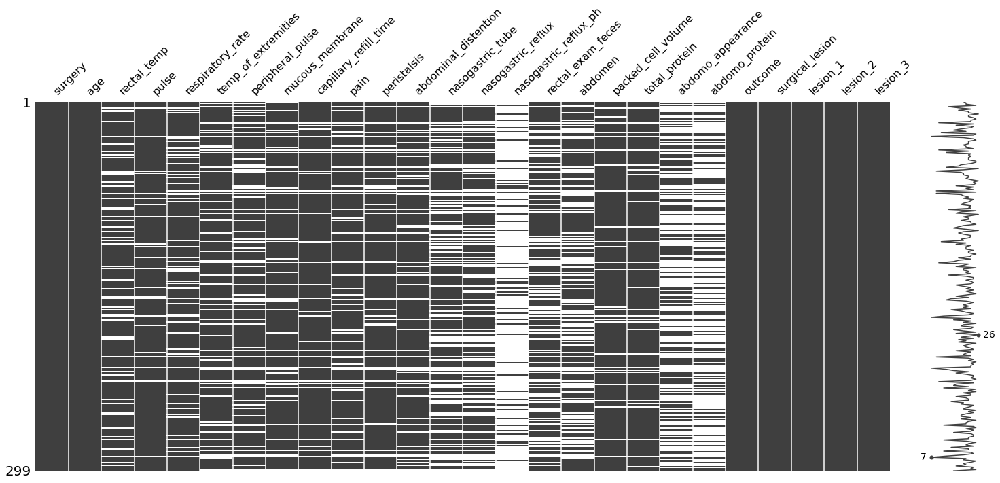

In [21]:
msno.matrix(df_treino);

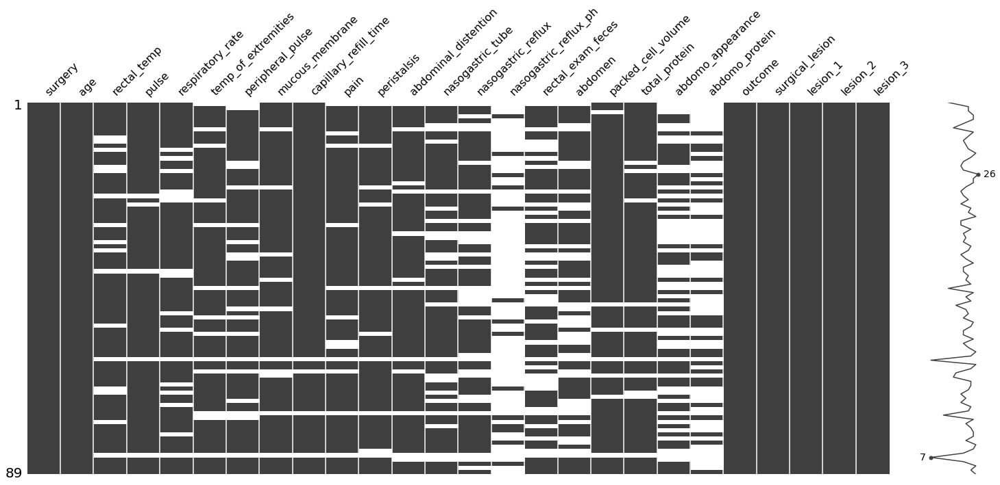

In [22]:
msno.matrix(df_teste);

> Como pode ser observado, tanto em treino como em teste, muitos atributos apresentam missing values, evidenciados pelos
> espaços em branco nas duas matrizes acima.
> Especialmente, **nasogastric_reflux_ph**, **abdomo_appearance** e **abdomo_protein**, parecem ser os atributos mais afetados
> por *missing values*.

## Pandas profiling

In [23]:
ProfileReport(pd.concat([df_treino, df_teste]))

## *Outliers*

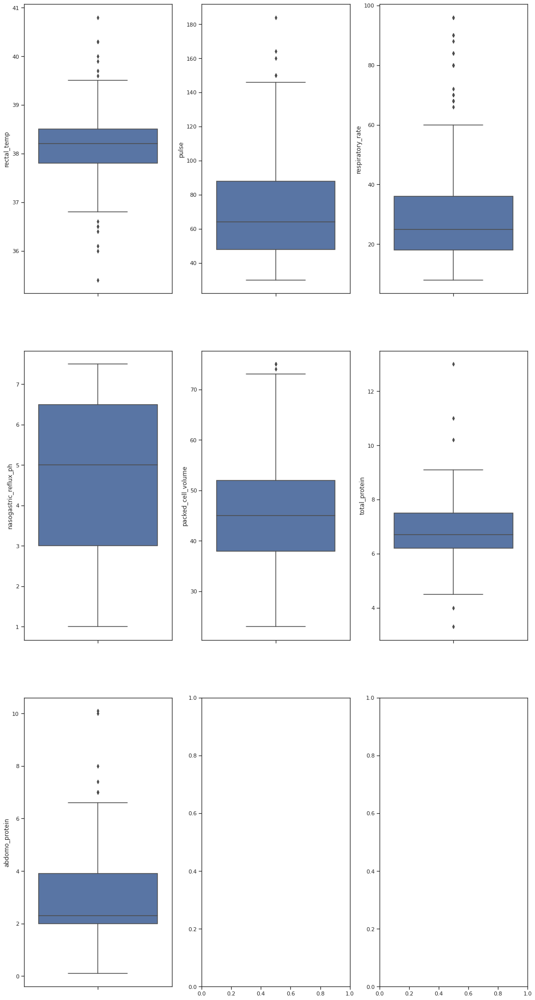

In [24]:
sns.set_theme(style="ticks")
fig, ax = plt.subplots(int(np.ceil((len(numericas)/3))), 3, figsize=(18,36))
for i, n in enumerate(numericas):
    sns.boxplot(data=df_treino, y=n, ax=ax.flat[i]);
    
plt.show();

> Sem a experiência de um especialista em saúde de cavalos, é difícil afirmar que os pontos acima detectados são *outliers*,
> até mesmo porque apesar de estarem além e aquém dos quartis superiores e inferiores, respectivamente, os pontos
> não estão em ordens de grandeza superior.

## Relação entre atributos

<Figure size 7200x1800 with 0 Axes>

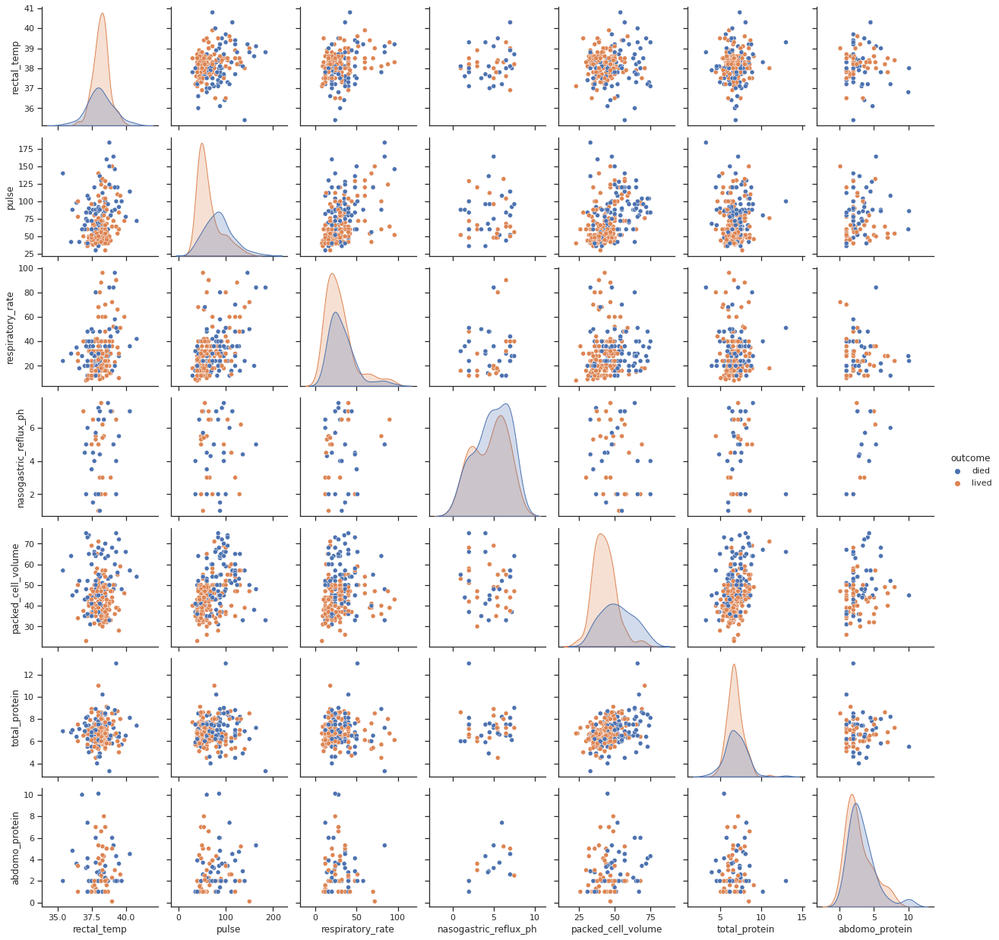

In [25]:
sns.set_theme(style="ticks")
plt.figure(figsize=(100,25));
# para análise removo os campos 'lesion_1', 'lesion_2' e 'lesion_3' por 
# parecerem numéricos mas são categóricos
sns.pairplot(df_treino.drop(columns=['lesion_1','lesion_2','lesion_3']), hue="outcome");
plt.show();

# Tratamento de missing values

In [26]:
imputers = {}
# defino um 'imputer' para cada atributo
# para os numéricos substituo pela mediana
for n in numericas:
    if df_treino[n].isnull().count() > 0:
        imputers[n] = SimpleImputer(strategy='median').fit(df_treino[[n]])
# para as categóricas substituo pela moda        
for c in categoricas:
    if df_treino[c].isnull().count() > 0:
        imputers[c] = SimpleImputer(strategy='most_frequent').fit(df_treino[[c]])            

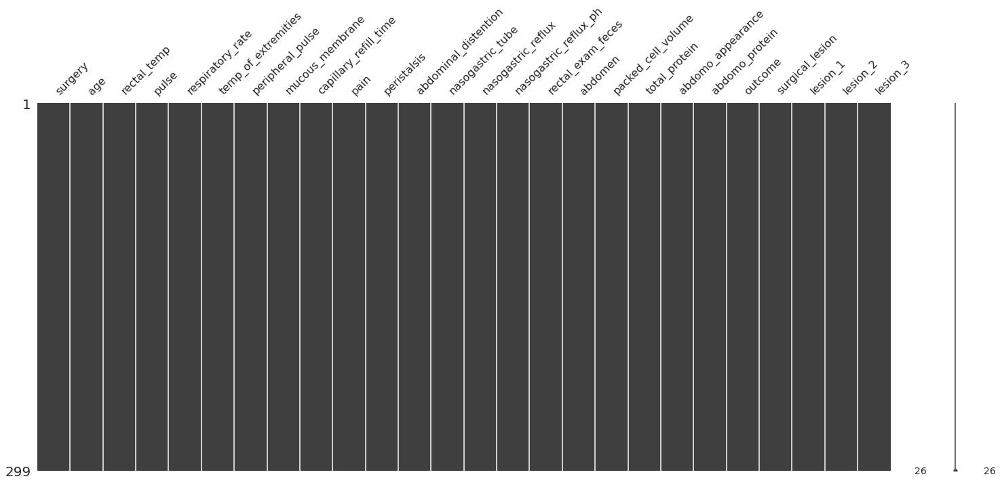

In [27]:
# aplico em treino
for attr in imputers:
    df_treino[attr] = imputers[attr].transform(df_treino[[attr]])
# verifico novamente como fica a base
msno.matrix(df_treino);

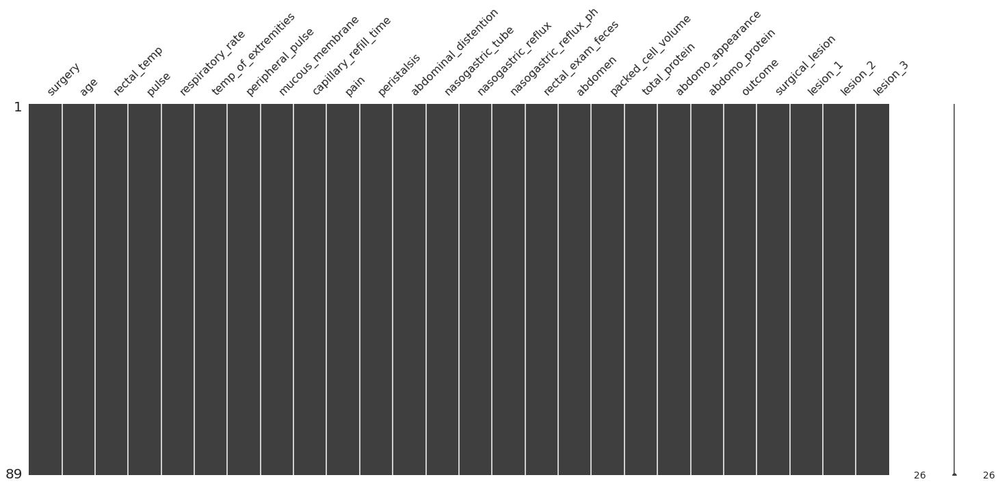

In [28]:
# aplico em teste
for attr in imputers:
    df_teste[attr] = imputers[attr].transform(df_teste[[attr]])
# verifico novamente como fica a base
msno.matrix(df_teste);

# União das bases para *numerical encoding*

Para fazer um tratamento único nos dados (dummy encoding), vou unir as bases em um só data frame mas vou manter o rastro do que é teste e treino.

In [29]:
# em cada base (data frame de treino e teste) incluo uma coluna chamada
# 'origem' e preencho com o valor 'treino' e 'teste' para marcar de onde 
# aquele registro veio, e quando estiverem unidos poder saber de onde
# vieram. Assim vou conseguir separá-los depois de aplicar o dummy encoding
df_treino['origem'] = ('treino '*len(df_treino)).split()
df_teste['origem'] = ('teste '*len(df_teste)).split()
data = pd.concat([df_treino, df_teste])
data

,surgery,age,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,...,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,origem
0,no,adult,38.5,66.0,28.0,cool,reduced,normal_pink,more_3_sec,extreme_pain,...,45.0,8.4,cloudy,2.3,died,no,11300,0,0,treino
1,yes,adult,39.2,88.0,20.0,cool,normal,pale_cyanotic,less_3_sec,mild_pain,...,50.0,8.5,cloudy,2.0,died,no,2208,0,0,treino
2,no,adult,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,...,33.0,6.7,cloudy,2.3,lived,no,0,0,0,treino
3,yes,young,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,...,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0,treino
4,no,adult,37.3,104.0,35.0,cool,normal,dark_cyanotic,more_3_sec,mild_pain,...,74.0,7.4,cloudy,2.3,died,no,4300,0,0,treino
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,yes,adult,38.2,64.0,25.0,cool,normal,normal_pink,less_3_sec,mild_pain,...,45.0,6.7,cloudy,2.3,lived,yes,2124,0,0,teste
85,no,adult,38.6,45.0,16.0,warm,normal,bright_pink,less_3_sec,alert,...,43.0,5.8,cloudy,2.3,lived,no,0,0,0,teste
86,yes,adult,38.9,80.0,44.0,cool,reduced,pale_pink,less_3_sec,depressed,...,54.0,6.5,serosanguious,2.3,died,yes,7111,0,0,teste
87,yes,adult,37.0,66.0,20.0,normal,reduced,bright_pink,less_3_sec,severe_pain,...,35.0,6.9,cloudy,2.3,died,yes,31110,0,0,teste


# Codificar atributos categóricos em numéricos

In [30]:
# para poder evidenciar o resultado do dummy encoding eu listo
# as colunas da base antes e depois da transformação
antes = data.columns.to_list()
antes.remove('origem')
antes.remove('outcome')
data = pd.get_dummies(data=data, columns=categoricas, drop_first=True)
depois = data.columns.to_list()
depois.remove('origem')
depois.remove('outcome')
print(f"Antes ({len(antes)}):\n{antes}")
print()
print(f"Depois ({len(depois)}):\n{depois}")

Antes (25):
['surgery', 'age', 'rectal_temp', 'pulse', 'respiratory_rate', 'temp_of_extremities', 'peripheral_pulse', 'mucous_membrane', 'capillary_refill_time', 'pain', 'peristalsis', 'abdominal_distention', 'nasogastric_tube', 'nasogastric_reflux', 'nasogastric_reflux_ph', 'rectal_exam_feces', 'abdomen', 'packed_cell_volume', 'total_protein', 'abdomo_appearance', 'abdomo_protein', 'surgical_lesion', 'lesion_1', 'lesion_2', 'lesion_3']

Depois (112):
['rectal_temp', 'pulse', 'respiratory_rate', 'nasogastric_reflux_ph', 'packed_cell_volume', 'total_protein', 'abdomo_protein', 'surgery_yes', 'age_young', 'temp_of_extremities_cool', 'temp_of_extremities_normal', 'temp_of_extremities_warm', 'peripheral_pulse_increased', 'peripheral_pulse_normal', 'peripheral_pulse_reduced', 'mucous_membrane_bright_red', 'mucous_membrane_dark_cyanotic', 'mucous_membrane_normal_pink', 'mucous_membrane_pale_cyanotic', 'mucous_membrane_pale_pink', 'capillary_refill_time_less_3_sec', 'capillary_refill_time_mor

> Depois do dummy encoding passamos a ter 112 atributos! Os principais responsáveis são os campos 'lesion_1', 'lesion_2' e 'lesion_3'
por apresentarem alta cardinalidade.

# Separação de treino e teste

In [31]:
# agora que as bases estão codificadas em campos numéricos
# separo olhando a coluna 'origem' que defini antes da união das mesmas

# treino
df_treino = data[data.origem == 'treino'].drop(columns='origem')
labels_treino = df_treino['outcome'] # y_treino
feats_treino = df_treino.drop(columns=['outcome']) # X_treino
labels_treino.shape, feats_treino.shape

((299,), (299, 112))

In [32]:
# teste
df_teste = data[data.origem == 'teste'].drop(columns='origem')
labels_teste = df_teste['outcome'] # y_teste
feats_teste = df_teste.drop(columns=['outcome']) # X_teste
labels_teste.shape, feats_teste.shape

((89,), (89, 112))

# Balanceamento

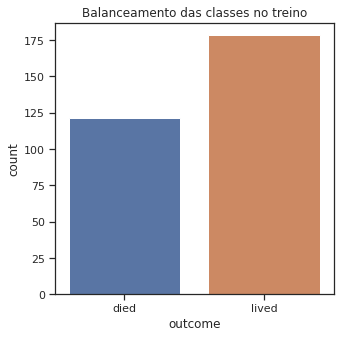

lived: 59.53%, died: 40.47%


In [33]:
plt.figure(figsize=(5,5))
sns.countplot(data=pd.DataFrame(labels_treino), x='outcome', order=['died', 'lived'])
plt.title('Balanceamento das classes no treino')
plt.show();
# pego as quantidades de cada uma das labels
# e calculo o percentual das mesmas
lived, died = labels_treino.value_counts()
soma = sum((lived, died))
print(f'lived: {lived/soma*100:.2f}%, died: {died/soma*100:.2f}%')

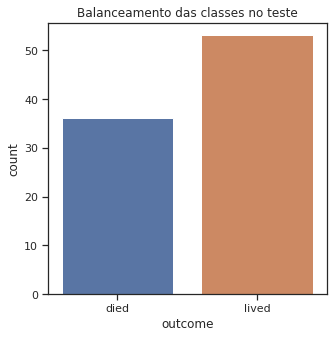

lived: 59.55%, died: 40.45%


In [34]:
plt.figure(figsize=(5,5))
sns.countplot(data=pd.DataFrame(labels_teste), x='outcome', order=['died', 'lived'])
plt.title('Balanceamento das classes no teste')
plt.show();
# pego as quantidades de cada uma das labels
# e calculo o percentual das mesmas
lived, died = labels_teste.value_counts()
soma = sum((lived, died))
print(f'lived: {lived/soma*100:.2f}%, died: {died/soma*100:.2f}%')

> **Base de teste foi gerada de forma estratificada.**

# Pré-processamento


## Normalização dos dados

In [35]:
# treino um normalizador com a base de treino
normalizer = StandardScaler().fit(feats_treino)
def normaliza(df):
    return normalizer.transform(df)

## PCA

In [36]:
# treino o PCA sem parâmetro
# normalizo a base para o PCA
pca = PCA().fit(normaliza(feats_treino))

In [37]:
# mas ele não reduz nenhuma dimensão
pca.n_components_

112

> Sem parâmetros, o PCA acaba não reduzindo a dimensão dos dados.

In [38]:
# aplico alguns parâmetros consultando a documentação
# do sklearn e continuo normalizando a base
pca = PCA(n_components='mle', svd_solver='full').fit(normaliza(feats_treino))

In [39]:
# aí o PCA consegue reduzir de 112 para 111 dimensões :/
pca.n_components_

111

> Já utilizando os parâmetros acima, o PCA só reduz em 1 dimensão a entrada dos dados.

In [40]:
# também crio uma função que aplica o PCA em bases
# passadas como argumento
# e já aplico a normalização na mesma
def pcaliza(df):
    return pca.transform(normaliza(df))

# Modelos

## SVC

In [41]:
# crio uma lista que vai armazenar os modelos SVC a serem avaliados
# quando a base é submetida a vários tratamentos
modelos_svc = []

### Sem pré-processamento

In [42]:
# armazeno o modelo treinado
# as legendas
# o titulo do modelo
# uma funcao que descreve o pré-processamento aplicado
# esses parâmetros vão ser utilizados pela função definida lá
# no início que imprime as métricas e as matrizes de confusão
# dos modelos na lista
modelos_svc.append(
    {
        'modelo': treinaSVC(feats_treino, labels_treino),
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only',
        'pre': lambda d: d,
    }
)

### Com pré-processamento

#### + normalização

In [43]:
# modelo + normalização
modelos_svc.append(
    {
        'modelo': treinaSVC(normaliza(feats_treino), labels_treino),
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only + norm',
        'pre': lambda d: normaliza(d),
    }
)

#### + PCA

In [44]:
# modelo + PCA (lembrando que a função 'pcaliza' já aplica normalização)
modelos_svc.append(
    {
        'modelo': treinaSVC(pcaliza(feats_treino), labels_treino),
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only + PCA',
        'pre': lambda d: pcaliza(d),
    }
)

### GridSearch

In [45]:
# defino os hiper-parâmetros e os seus valores que vou 
# testar com o GridSearch
svc_tuned_parameters = [
    {
        'kernel': [ 'rbf', 'linear', 'poly' ], 
        'gamma': [ 1, 0.1, 0.01 ],
        'C': [ 1, 10, 100, 1000 ],
    }
]

#### Sem pré-processamento

In [46]:
modelo_svc_3 = GridSearchCV(SVC(), svc_tuned_parameters, scoring='f1_micro', n_jobs=-1, verbose=3)
modelo_svc_3.fit(feats_treino, labels_treino)
print('Parâmetros do modelo: ', modelo_svc_3.best_params_)

modelos_svc.append(
    {
        'modelo': modelo_svc_3.best_estimator_,
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only + GridSearch',
        'pre': lambda d: d,
    }
)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:  2.6min finished


Parâmetros do modelo:  {'C': 1, 'gamma': 1, 'kernel': 'linear'}


#### Com pré-processamento

##### + Normalização

In [47]:
modelo_svc_4 = GridSearchCV(SVC(), svc_tuned_parameters, scoring='f1_micro', n_jobs=-1, verbose=3)
modelo_svc_4.fit(normaliza(feats_treino), labels_treino)
print('Parâmetros do modelo: ', modelo_svc_4.best_params_)

modelos_svc.append(
    {
        'modelo': modelo_svc_4.best_estimator_,
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only + norm + GridSearch',
        'pre': lambda d: normaliza(d),
    }
)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.4s


Parâmetros do modelo:  {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:    5.7s finished


##### + PCA

In [48]:
modelo_svc_5 = GridSearchCV(SVC(), svc_tuned_parameters, scoring='f1_micro', n_jobs=-1, verbose=3)
modelo_svc_5.fit(pcaliza(feats_treino), labels_treino)
print('Parâmetros do modelo: ', modelo_svc_5.best_params_)

modelos_svc.append(
    {
        'modelo': modelo_svc_5.best_estimator_,
        'leg': ['Died', 'Lived'],
        'titulo': 'SVC Only + PCA + GridSearch',
        'pre': lambda d: pcaliza(d),
    }
)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.5s


Parâmetros do modelo:  {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:    6.3s finished


### Resultados

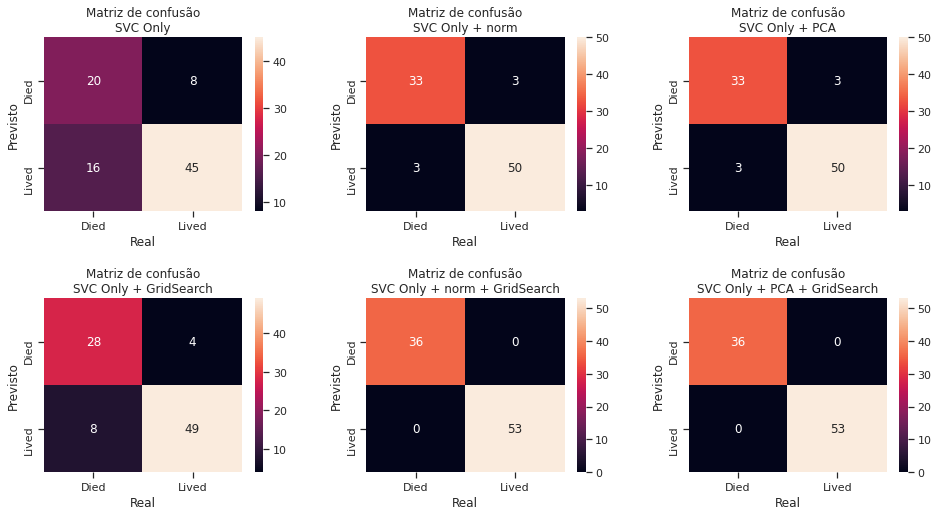


     -------- | ---------------------------------------
     Modelo   | SVC Only                                       
     Acurácia | 0.730                                     
     F1 Score | 0.723                                     
     Kappa    | 0.420                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | SVC Only + norm                                       
     Acurácia | 0.933                                     
     F1 Score | 0.933                                     
     Kappa    | 0.860                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | SVC Only + PCA                                       
     Acurácia | 0.933                                     
     F1 Score | 0.933                                     
     Kappa    | 0.860             

In [49]:
avalia_modelos(feats_teste, labels_teste, modelos_svc, figsize=(16,8))

## Decision Tree

In [50]:
modelos_dt = []

### Sem pré-processamento

In [51]:
modelos_dt.append(
    {
        'modelo': treinaDT(feats_treino, labels_treino),
        'titulo': 'DT Only',
        'leg': ['Died', 'Lived'],
        'pre': lambda d: d,
    }
) 

### Com pré-processamento

#### + normalização

In [52]:
modelos_dt.append(
    {
        'modelo': treinaDT(normaliza(feats_treino), labels_treino),
        'titulo': 'DT Only + norm',
        'leg': ['Died', 'Lived'],
        'pre': lambda d: normaliza(d),
    }
)

#### + PCA

In [53]:
modelos_dt.append(
    {
        'modelo': treinaDT(pcaliza(feats_treino), labels_treino),
        'titulo': 'DT Only + PCA',
        'leg': ['Died', 'Lived'],
        'pre': lambda d: pcaliza(d),
    }
)

### Resultados

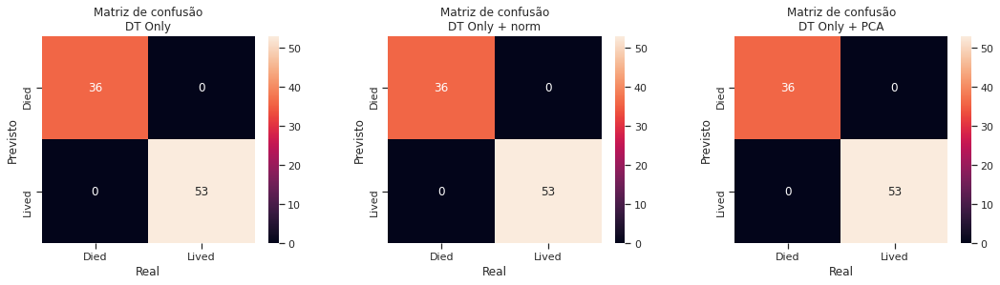


     -------- | ---------------------------------------
     Modelo   | DT Only                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | DT Only + norm                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | DT Only + PCA                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                

In [54]:
avalia_modelos(feats_teste, labels_teste, modelos_dt, figsize=(18,4))


#### Plot da árvore

In [55]:
for m in modelos_dt:
    print("Modelo: " + m['titulo'])
    fig, ax = plt.subplots(figsize=(200, 100))
    tree.plot_tree(m['modelo'], class_names=['Died', 'Lived'], filled=True, rounded=True);
    plt.show();

Modelo: DT Only


Modelo: DT Only + norm


Modelo: DT Only + PCA


## Random Forest

In [56]:
modelos_rf = []

### Sem pré-processamento

In [57]:
modelos_rf.append(
    {
        'modelo': treinaRF(feats_treino, labels_treino),
        'leg': ['Died', 'Lived'],
        'pre': lambda d: d,
        'titulo': 'RF Only',
    }
)

### Com pré-processamento

#### + normalização

In [58]:
modelos_rf.append(
    {
        'modelo': treinaRF(normaliza(feats_treino), labels_treino),
        'leg': ['Died', 'Lived'],
        'pre': lambda d: normaliza(d),
        'titulo': 'RF Only + norm',
    }
)

#### + PCA

In [59]:
modelos_rf.append(
    {
        'modelo': treinaRF(pcaliza(feats_treino), labels_treino),
        'leg': ['Died', 'Lived'],
        'pre': lambda d: pcaliza(d),
        'titulo': 'RF Only + PCA',
    }
)

### Resultados

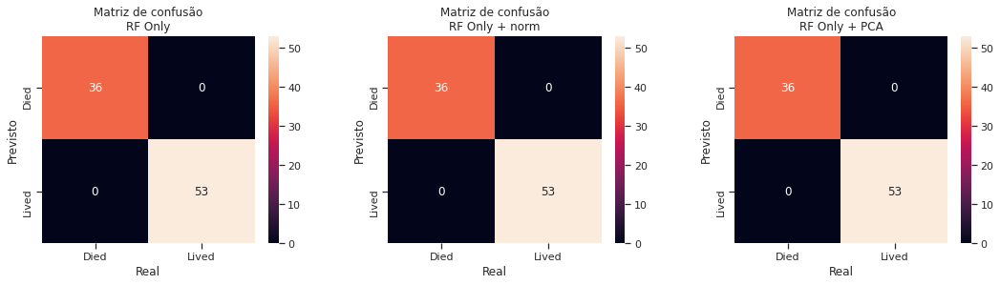


     -------- | ---------------------------------------
     Modelo   | RF Only                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | RF Only + norm                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | RF Only + PCA                                       
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                

In [60]:
avalia_modelos(feats_teste, labels_teste, modelos_rf, figsize=(18,4))

## KNN

In [61]:
modelos_knn = []

### Sem pré-processamento

In [62]:
modelos_knn.append(
    {
        'modelo': treinaKNN(feats_treino, labels_treino),
        'pre': lambda d: d,
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only',
    }
)

### Com pré-processamento

#### + normalização

In [63]:
modelos_knn.append(
    {
        'modelo': treinaKNN(normaliza(feats_treino), labels_treino),
        'pre': lambda d: normaliza(d),
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only + norm',
    }
)

#### + PCA

In [64]:
modelos_knn.append(
    {
        'modelo': treinaKNN(pcaliza(feats_treino), labels_treino),
        'pre': lambda d: pcaliza(d),
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only + PCA',
    }
)

### Grid Search

In [65]:
knn_tuned_parameters = [
    {
        'n_neighbors': range(5,10),
        'metric': [ 'minkowski', 'euclidean', 'manhattan', 'chebyshev' ],
        'weights': [ 'uniform', 'distance' ],
    }
]

#### Sem pré-processamento

In [66]:
modelo_knn_0 = GridSearchCV(KNeighborsClassifier(), knn_tuned_parameters, scoring='f1_micro', n_jobs=-1)
modelo_knn_0.fit(feats_treino, labels_treino)

print('Parâmetros do modelo: ', modelo_knn_0.best_params_)

modelos_knn.append(
    {
        'modelo': modelo_knn_0.best_estimator_,
        'pre': lambda d: d,
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only + GridSearch',
    }
)

Parâmetros do modelo:  {'metric': 'manhattan', 'n_neighbors': 8, 'weights': 'distance'}


#### Com pré-processamento

##### + normalização

In [67]:
modelo_knn_1 = GridSearchCV(KNeighborsClassifier(), knn_tuned_parameters, scoring='f1_micro', n_jobs=-1)
modelo_knn_1.fit(normaliza(feats_treino), labels_treino)

print('Parâmetros do modelo: ', modelo_knn_1.best_params_)

modelos_knn.append(
    {
        'modelo': modelo_knn_1.best_estimator_,
        'pre': lambda d: normaliza(d),
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only + norm + GridSearch',
    }
)

Parâmetros do modelo:  {'metric': 'manhattan', 'n_neighbors': 8, 'weights': 'distance'}


##### + PCA

In [68]:
modelo_knn_2 = GridSearchCV(KNeighborsClassifier(), knn_tuned_parameters, scoring='f1_micro', n_jobs=-1)
modelo_knn_2.fit(pcaliza(feats_treino), labels_treino)

print('Parâmetros do modelo: ', modelo_knn_2.best_params_)

modelos_knn.append(
    {
        'modelo': modelo_knn_2.best_estimator_,
        'pre': lambda d: pcaliza(d),
        'leg': ['Died', 'Lived'],
        'titulo': 'KNN Only + PCA + GridSearch',
    }
)

Parâmetros do modelo:  {'metric': 'chebyshev', 'n_neighbors': 8, 'weights': 'uniform'}


### Resultados

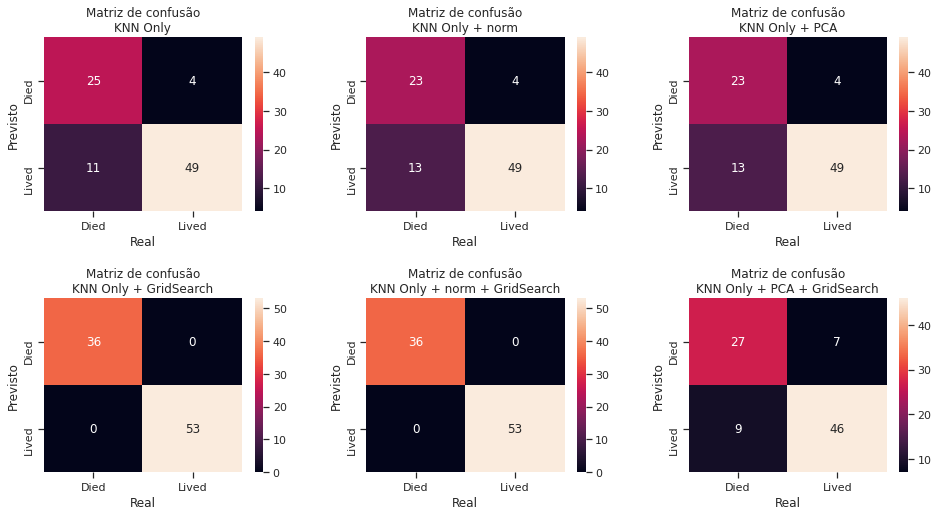


     -------- | ---------------------------------------
     Modelo   | KNN Only                                       
     Acurácia | 0.831                                     
     F1 Score | 0.828                                     
     Kappa    | 0.639                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | KNN Only + norm                                       
     Acurácia | 0.809                                     
     F1 Score | 0.803                                     
     Kappa    | 0.587                                     
     -------- | ---------------------------------------
  

     -------- | ---------------------------------------
     Modelo   | KNN Only + PCA                                       
     Acurácia | 0.809                                     
     F1 Score | 0.803                                     
     Kappa    | 0.587             

In [69]:
avalia_modelos(feats_teste, labels_teste, modelos_knn, figsize=(16,8))

# Redução de features

Uma vez que conseguimos gerar modelos com resultado bastante satisfatório aplicando a normalização e, para alguns, ajustando hiper-parâmetros, por que não vamos além e tentamos reduzir e identificar as *features* que contribuem para o modelo? Se pudermos identificar *features* que possam ser desconsideradas no processo de classificação, pode ser muito interessante que os médicos possam priorizar a avaliação das features mais prioritárias na avaliação do desfecho iminente do animal, trazendo ganho de tempo, podendo significar mais chance de sobrevivência, e redução de gasto, não realizando testes que não contribuem com a avaliação.

## DT

Escolhemos a Decision Tree como modelo para verificar a redução de features porque foi o modelo que apresentou a melhor performance, mesmo sem pré-processamento, é de mais fácil interpretação do que os demais.

In [70]:
# quero que seja um número menor do que
# um quarto das features que já tenho
# (só determinei 1/4 das features iniciais porque já
# testei e constatei que o algoritmo consegue achar valores
# dessa grandeza)
feats_amount=112
while feats_amount >= 28:
    modelo_dt = DecisionTreeClassifier()
    # instancio um novo modelo de DecisionTree
    # passo esse modelo para o algoritmo de seleção de features
    # e deixo esse algoritmo identificar os melhores atributos
    # para o modelo
    rfecv = RFECV(estimator=modelo_dt, step=1, scoring='f1_micro', min_features_to_select=1)
    rfecv.fit(feats_treino, labels_treino)
    feats_amount = rfecv.n_features_
print('# de features com melhor score:', rfecv.n_features_)

# de features com melhor score: 11


## Performance do modelo x quantidade de atributos selecionados

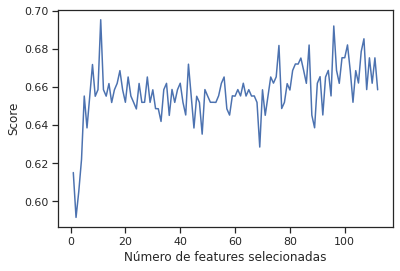

In [71]:
# uma vez de posse da conclusão do RFECV, ploto
# um gráfico indicando a performance do modelo x quantidade
# de atributos utilizados
plt.figure()
plt.xlabel("Número de features selecionadas")
plt.ylabel("Score")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

## Avaliação do modelo com a redução de atributos


     -------- | ---------------------------------------
     Acurácia | 0.989                                     
     F1 Score | 0.989                                     
     Kappa    | 0.977                                     
     -------- | ---------------------------------------
  


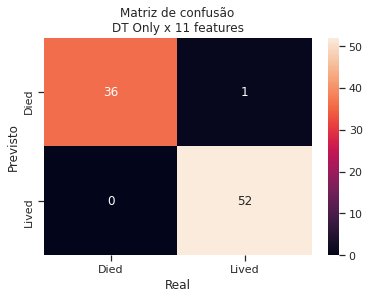

In [72]:
# agora avalio como ficou a performance 
# desse modelo de DT aplicando 
# a redução de atributos
labels_pred = rfecv.predict(feats_teste)
acc = accuracy_score(labels_teste, labels_pred)
kappa = cohen_kappa_score(labels_teste, labels_pred)
f1 = f1_score(labels_teste, labels_pred, average='weighted')
print("""
     -------- | ---------------------------------------
     Acurácia | {:.3f}                                     
     F1 Score | {:.3f}                                     
     Kappa    | {:.3f}                                     
     -------- | ---------------------------------------
  """.format(acc, f1, kappa))
confMatrix = confusion_matrix(labels_pred, labels_teste)
fig, ax = plt.subplots(1,1)
sns.heatmap(confMatrix, annot=True, fmt=".0f", ax=ax)
ax.set(xlabel='Real')
ax.set(ylabel='Previsto')
ax.set_title('Matriz de confusão\n' + f'DT Only x {rfecv.n_features_} features')
ax.xaxis.set_ticklabels(('Died','Lived'))
ax.yaxis.set_ticklabels(('Died','Lived'))
plt.show()

> Como se pode verificar, a performance do modelo continua praticamente a mesma, porém este novo modelo é capaz de 
oferecer o mesmo resultado, analisando um número bem menor de atributos. 
> Vale ainda ressaltar que os atributos selecionados ainda são os atributos artificiais gerados pelo
dummy encoding, então significa que muitos tem origem na mesma análise do profissional sobre o animal.

## Mas... 
Se definirmos uma função de predição conservadora, onde considerarmos que a pevisão é de vida,
em casos que a probabilidade calculada de viver seja maior que 50%...


     -------- | ---------------------------------------
     Acurácia | 1.000                                     
     F1 Score | 1.000                                     
     Kappa    | 1.000                                     
     -------- | ---------------------------------------
  


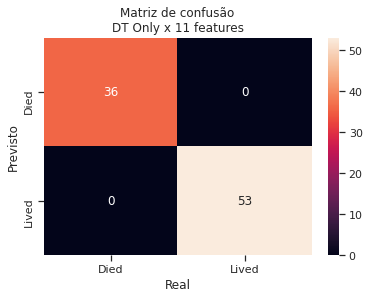

In [73]:
def predict_conservador(X):
    output = []
    for p_died, p_lived in rfecv.predict_proba(feats_teste):
        if p_lived >= 0.5:
            output.append('lived')
        else:
            output.append('died')
    return np.array(output)

labels_pred = predict_conservador(feats_teste)
acc = accuracy_score(labels_teste, labels_pred)
kappa = cohen_kappa_score(labels_teste, labels_pred)
f1 = f1_score(labels_teste, labels_pred, average='weighted')
print("""
     -------- | ---------------------------------------
     Acurácia | {:.3f}                                     
     F1 Score | {:.3f}                                     
     Kappa    | {:.3f}                                     
     -------- | ---------------------------------------
  """.format(acc, f1, kappa))
confMatrix = confusion_matrix(labels_pred, labels_teste)
fig, ax = plt.subplots(1,1)
sns.heatmap(confMatrix, annot=True, fmt=".0f", ax=ax)
ax.set(xlabel='Real')
ax.set(ylabel='Previsto')
ax.set_title('Matriz de confusão\n' + f'DT Only x {rfecv.n_features_} features')
ax.xaxis.set_ticklabels(('Died','Lived'))
ax.yaxis.set_ticklabels(('Died','Lived'))
plt.show()

> O modelo volta a ter a performance de 100% mas com muito menos atributos de entrada, podendo proporcionar 
economia de tempo e de recursos para a avalição do animal.

## E quais são os atributos selecionados?

In [74]:
features = feats_treino.columns.values
features = [ f for i, f in enumerate(features) if rfecv.ranking_[i] == 1 ]
features

['rectal_temp',
 'pulse',
 'respiratory_rate',
 'nasogastric_reflux_ph',
 'packed_cell_volume',
 'total_protein',
 'temp_of_extremities_cool',
 'abdominal_distention_none',
 'surgical_lesion_yes',
 'lesion_1_2124',
 'lesion_1_3209']

> Observando claro que esses são atributos formados também por atributos artificiais criados pelo dummy coding,
siginificando que precisam ser criticados por um especialistas e re-avaliados para uma implantação de análise
não computacional.

## Árvore de decisão resultante do modelo treinado com menos atributos de entrada

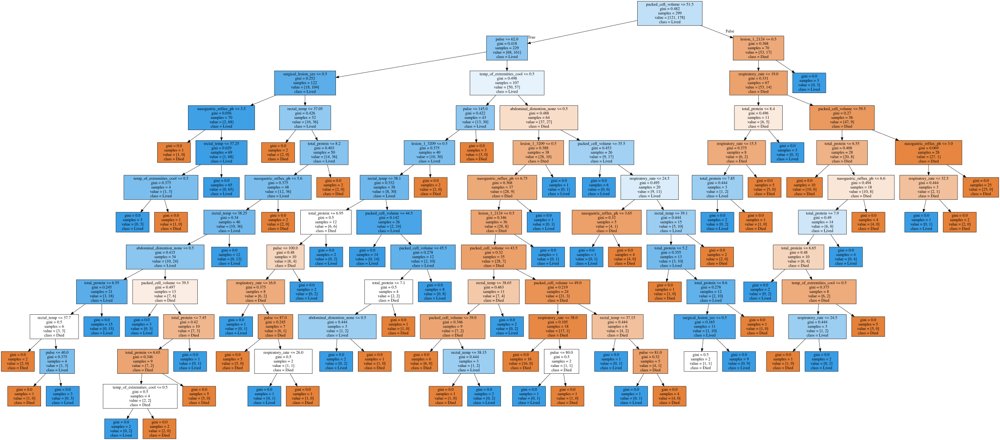

In [75]:
# se não possuir graphiz instalado
# fig, ax = plt.subplots(figsize=(100, 50))
# tree.plot_tree(
#                 rfecv.estimator_, 
#                 feature_names=features, 
#                 class_names=['Died', 'Lived'], 
#                 filled=True, 
#                 rounded=True,
#                 fontsize=14);
# plt.show();

# se possuir graphiz instalado
dot_data = tree.export_graphviz(
                                rfecv.estimator_, 
                                out_file=None, 
                                feature_names=features,
                                class_names=['Died','Lived'],
                                filled=True)
graph = graphviz.Source(dot_data, format="png") 
graph